# Taller: Materiales por Iluminación y Modelos de Color en un Mundo Virtual con Three.js

## 1. Concepto del mundo creado
Breve explicación de la idea principal:  
- Tema general : Es un mundo en ruinas basado en el videojuego de Hollow Knight Silksong, por ende consta de una lampara antigua, un edificio en ruinas y la protagonista es Hornet.  
- Objetivo:  Diseñar y crear un mundo virtual en el que la apariencia de los materiales cambie de forma coherente según la iluminación y el modelo de color, integrando modelos 3D (GLB), texturas (incluidas procedurales), movimiento animado, y cambio de cámara entre vista perspectiva y ortográfica.
---

## 2. Modelos GLB usados
| Nombre del modelo | Fuente (Sketchfab, Poly, etc.) | Modificaciones aplicadas |
|-------------------|--------------------------------|---------------------------|
| b293_special_blend_lm.glb | https://sketchfab.com/3d-models/b293-special-blend-lm-094660129a19496fa56c5beb4f0c712c | Escalado, transparencia y rotacion.  |
| japanese_statue_01_-_3d_scan_quixel_megascans.glb| https://sketchfab.com/3d-models/japanese-statue-01-3d-scan-quixel-megascans-df0ebfb440c341aeab08d9205580a710 |Escalado, escalado y rotacion|
| n_anniversary_40.glb |https://sketchfab.com/3d-models/n-anniversary-40-098effb437a2471d8ef55eb9f83ecbb1 | Escalado y animacion|

---




Modelo Estatua Japonesa

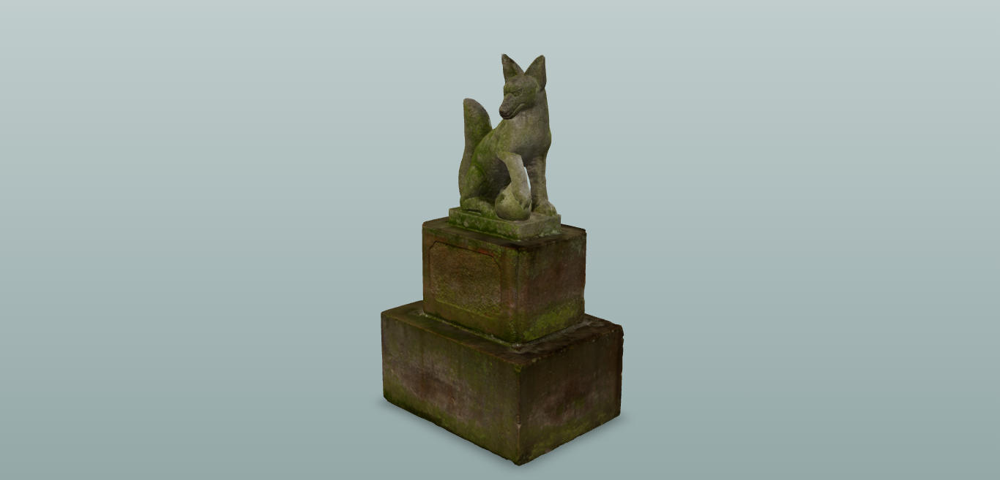

In [1]:
from IPython.display import Image
Image(filename='/content/01.png')

Modelo N (Personaje de Pokemon)

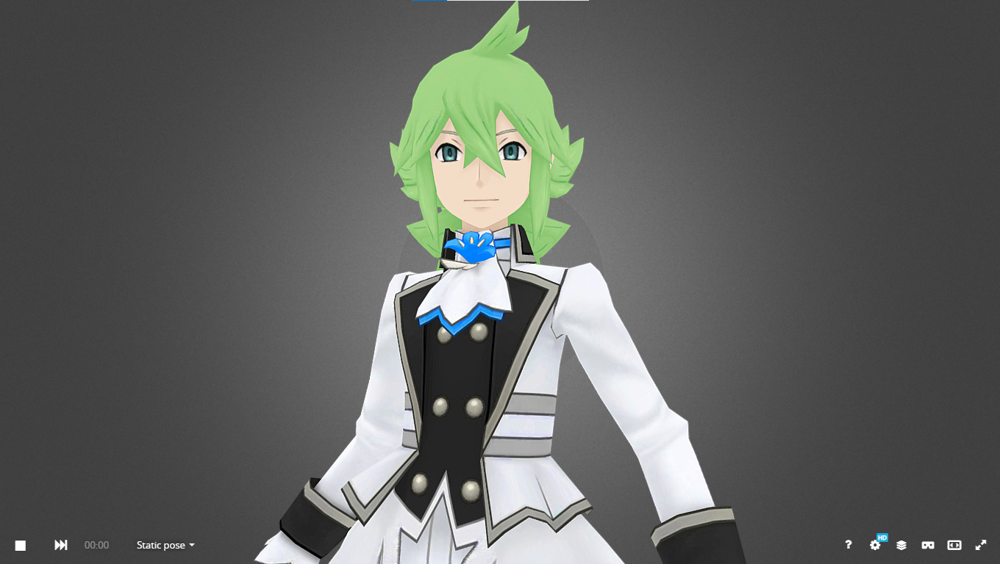

In [2]:
from IPython.display import Image
Image(filename='/content/02.png')

Modelo Escenario

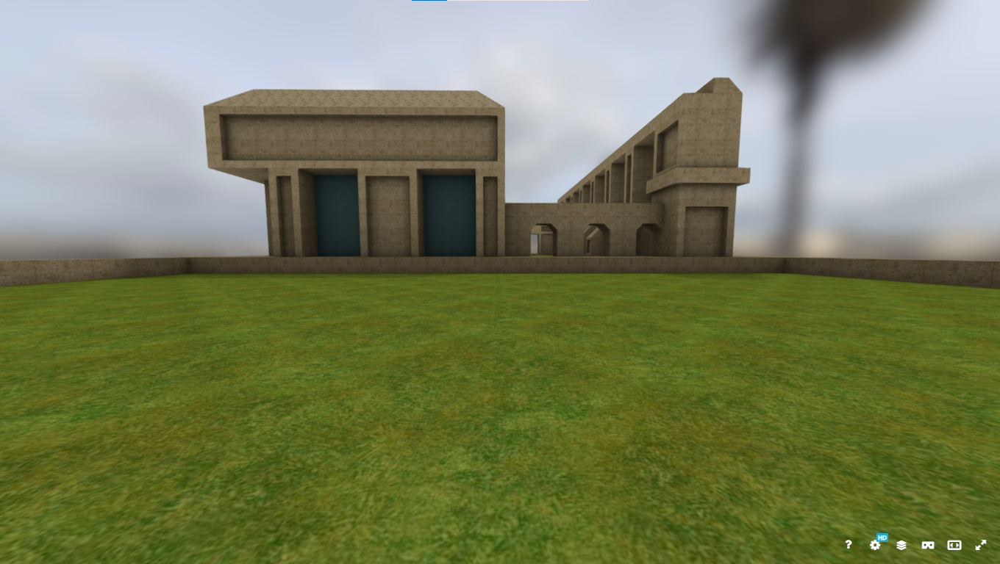

In [3]:
from IPython.display import Image
Image(filename='/content/03.png')

## 3. Iluminación aplicada
  ### Esquema key–fill–rim

**Luz principal (Key Light)**  
- Tipo: `DirectionalLight`  
- Posición: (X=5, Y=10, Z=5)  
- Color: tono cálido (anaranjado suave)  
- Intensidad: ~1.0  

**Luz de relleno (Fill Light)**  
- Tipo: `DirectionalLight`  
- Posición: (X=-5, Y=5, Z=-5)  
- Color: más frío (azulado frio)  
- Intensidad: ~0.5

**Luz de contorno (Rim Light)**  
- Tipo: `DirectionalLight`
- Posición: (X=0, Y=5, Z=-10)
- Color: blanco neutro
- Intensidad: ~0.7  

**Luz ambiental (Ambient Light)**  
- Tipo: `AmbientLight`
- Intensidad: ~0.3



---

## 4. Materiales y texturas (PBR)
- Parámetros principales:  
  - `roughness`: se modifica de acuerdo a la zona, para representar la dureza de un material.  
  - Normal map en el objeto de la lampara y en el edificio para dar textura como la madera o grietas en el edificio en ruinas.
- Justificación: Expresar el realismo de los materiales, como la madera vieja, una pared agrietada, entre otros.

---
Se adjunta a continuación una tabla con las texturas manejadas

In [5]:
import base64
from IPython.display import HTML

# Función para convertir imagen a base64
def img_to_base64(path):
    with open(path, "rb") as f:
        data = f.read()
    return base64.b64encode(data).decode()

# Datos de ejemplo (ajusta las rutas a tus imágenes en /content/)
texturas = ["Escenario",  "Personaje", "Estatua", "Personaje", "Personaje", "Escenario", "Escenario"]
imagenes = ["/content/descarga (2).png",   # cambia esta ruta por tu archivo subido
        "/content/descarga (3).png",
        "/content/descarga (4).png",
        "/content/descarga (5).png",
        "/content/descarga (6).png",
        "/content/descarga (7).png",
        "/content/descarga (8).png"]  # cambia por tus archivos

# Construcción de la tabla
html = "<table border='1' style='border-collapse:collapse; text-align:center;'>"
html += "<tr><th>Textura</th><th>Imagen</th></tr>"

for t, img in zip(texturas, imagenes, ):
    try:
        img64 = img_to_base64(img)
        img_tag = f"<img src='data:image/jpeg;base64,{img64}' width='100'>"
    except:
        img_tag = "(No encontrada)"
    html += f"<tr><td>{t}</td><td>{img_tag}</td></tr>"

html += "</table>"

# Mostrar
HTML(html)


Textura,Imagen
Escenario,
Personaje,
Estatua,
Personaje,
Personaje,
Escenario,
Escenario,


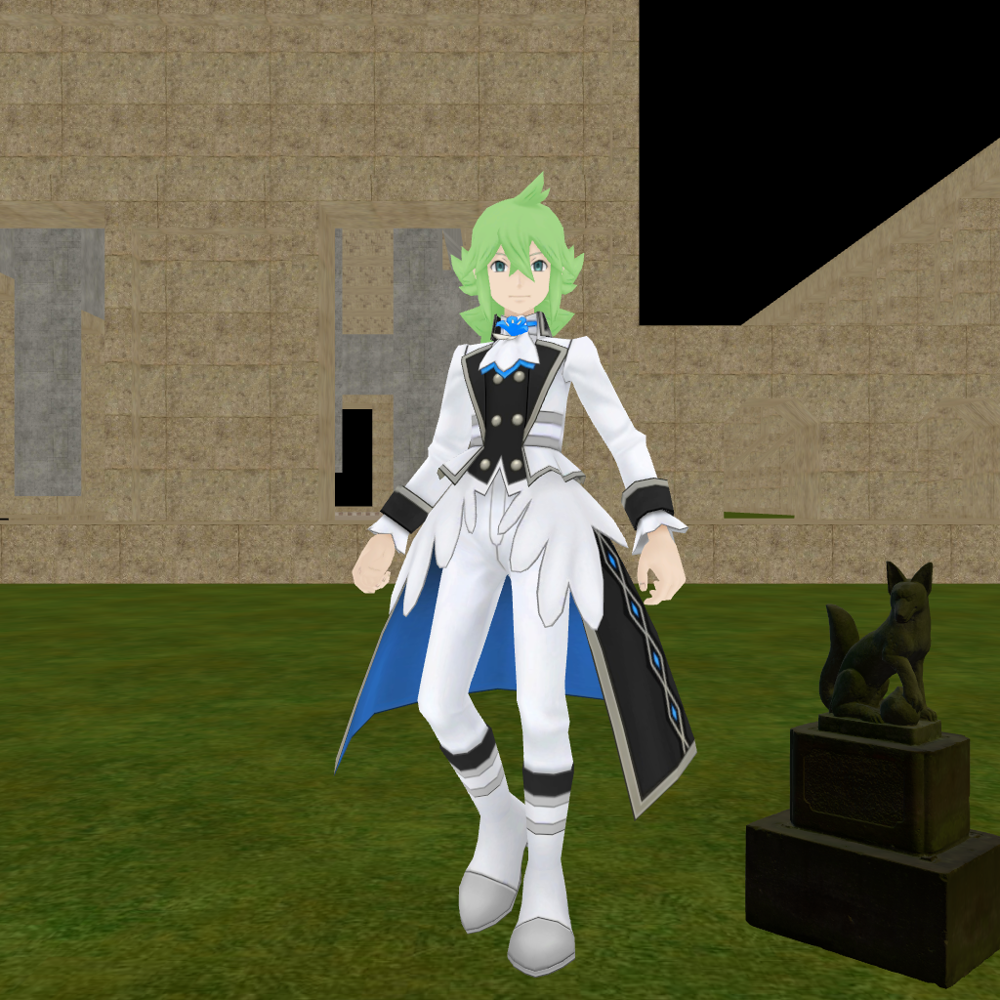

In [6]:
from IPython.display import Image
Image(filename='/content/descarga.png')


## 5. Shaders procedurales
Debido a que se emplea three.js editor online no se puede aplicar directamente los shaders procedurales.

Sin embargo el objeto de la lampara combina dos texturas para crear la textura que se visualiza. A continuación se adjunta una imagen que lo demuestra.

---

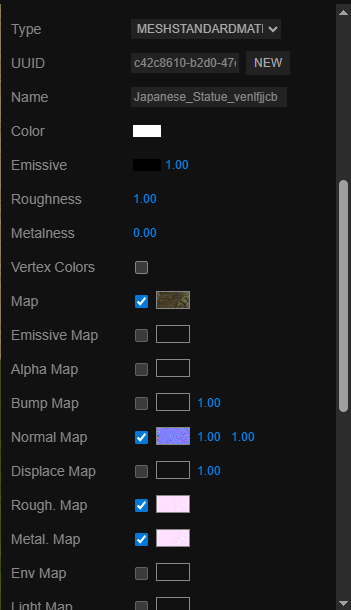

In [7]:
from IPython.display import Image
Image(filename='/content/04.png')

## 6. Cámaras
- **Perspectiva**: FOV 45°, posición (X=0.28,Y=4.32,Z=12). Muestra escala realista.  
- **Ortográfica**: vista desde arriba, posición (X=0,Y=20,Z=0).    

#####A continuación se adjuntan dos imagenes. Correspondientes a la vista desde la cámara perspectiva y la cámara ortográfica
---

Vista cámara perspectiva

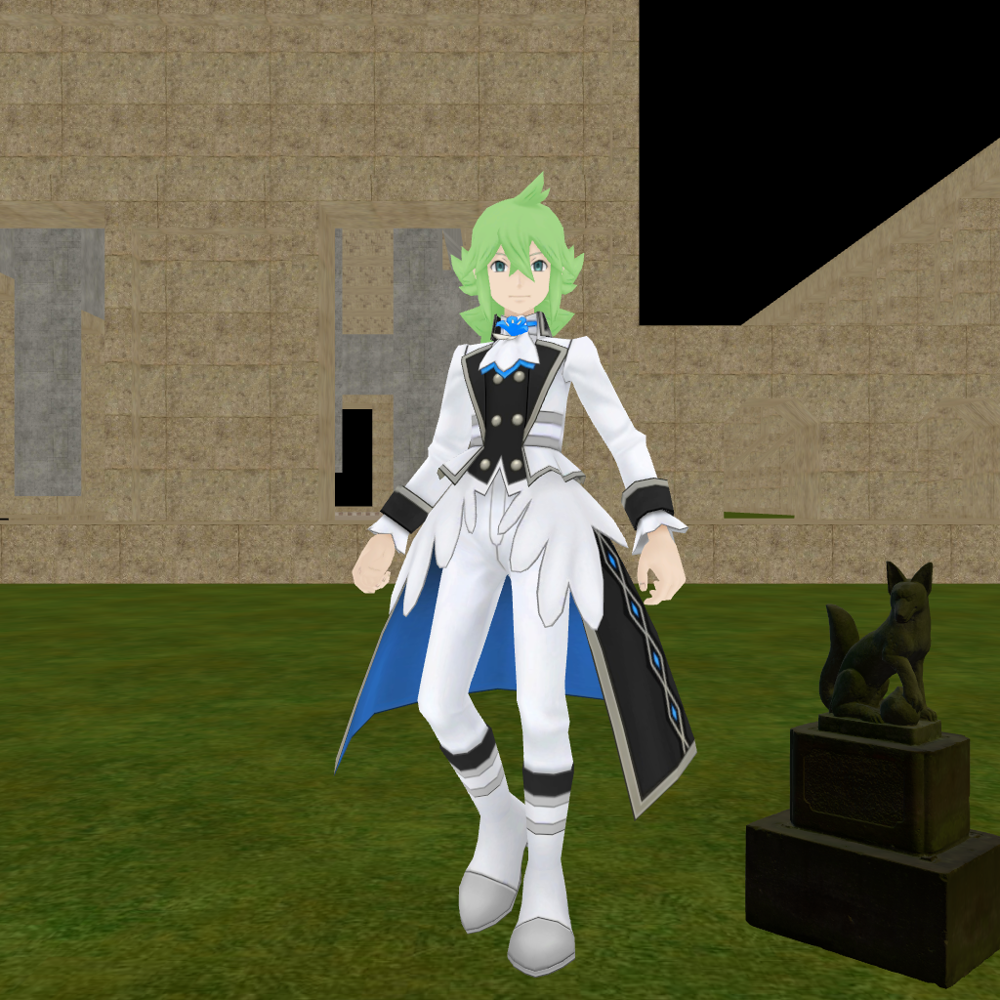

In [8]:
from IPython.display import Image
Image(filename='/content/descarga.png')

Viste de la cámara ortográfica

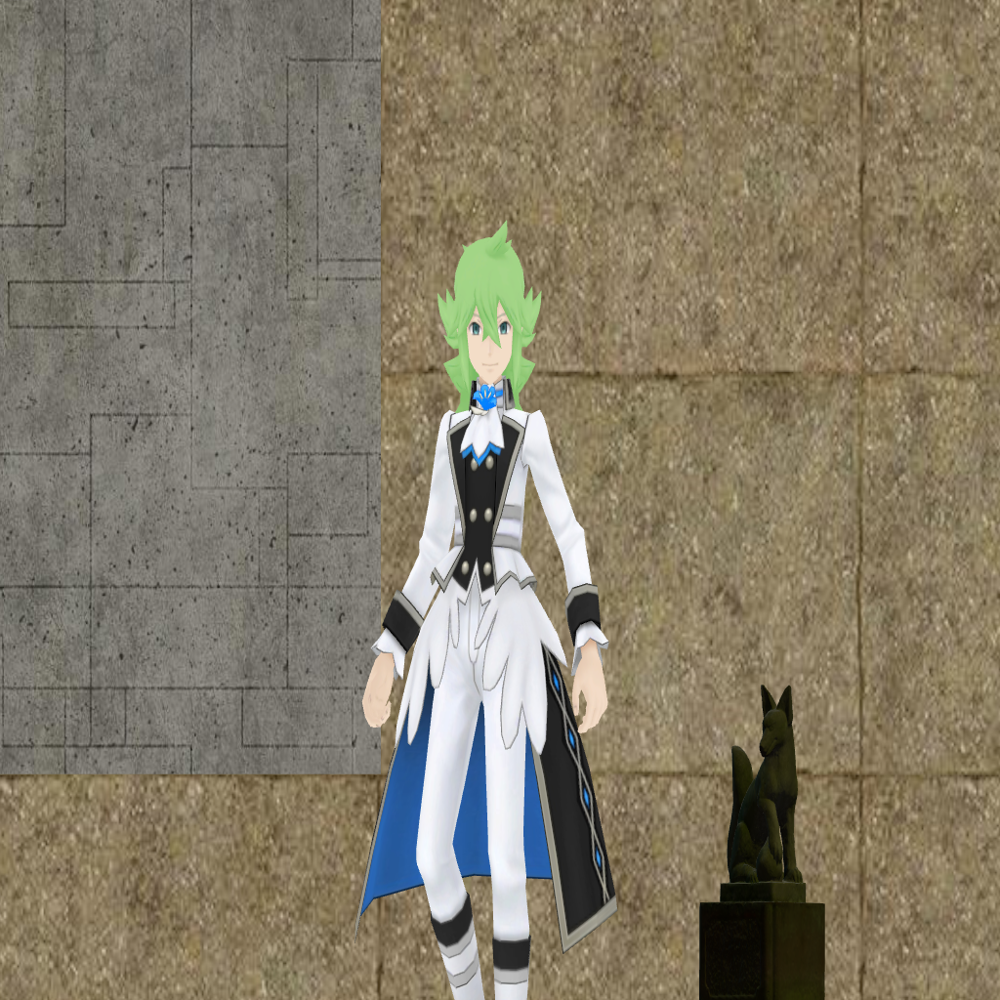

In [9]:
from IPython.display import Image
Image(filename='/content/descarga (1).png')

## 7. Animaciones
Se realizo una animación en la cual la camara debe rotar continuamente alrededor del punto (0,0,0). El código se encuentra pero por las capacidades del dispositivo se cree que no funciono.

Ademas hay una animación en el personaje principal en la cual mueve el arma.

---

In [14]:
from IPython.display import Image
Image(filename='/content/Final.gif')

Output hidden; open in https://colab.research.google.com to view.

## 8. Modelo de color
- Paleta definida en formato HEX a continuación
- Justificación perceptual: se basa en las paletas básicas del videojuego y del personaje.  

---

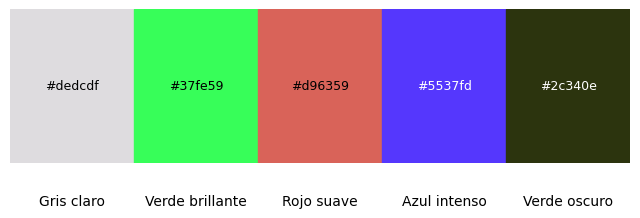

In [17]:
import matplotlib.pyplot as plt

# Colores principales extraídos de la imagen (HEX)
colors_hex = ["#dedcdf", "#37fe59", "#d96359", "#5537fd", "#2c340e"]
labels = ["Gris claro", "Verde brillante", "Rojo suave", "Azul intenso", "Verde oscuro"]

# Crear figura
fig, ax = plt.subplots(figsize=(8, 2))

# Dibujar los rectángulos de color
for i, (hex_color, label) in enumerate(zip(colors_hex, labels)):
    ax.add_patch(plt.Rectangle((i, 0), 1, 1, color=hex_color))
    ax.text(i + 0.5, -0.2, label, ha='center', va='top', fontsize=10)
    ax.text(i + 0.5, 0.5, hex_color, ha='center', va='center',
            fontsize=9, color="white" if i in [3,4] else "black")

# Ajustar vista
ax.set_xlim(0, len(colors_hex))
ax.set_ylim(0, 1)
ax.axis("off")

plt.show()











## 9. Evidencias visuales
### 📸 Capturas de pantalla
Se insertaron capturas de pantalla durante todo el documento de la implementación en cada sector. Revisar el documento.